# Relazioni spaziali ed operazioni

## obiettivi della lezione
- caricare dati tabellare (es. csv o xls) come geodataframe
- conversione di proiezioni spaziali
- relazioni spaziali
- join spaziale
- operazioni spaziali

*Dati utlizzati:**
- [ISTAT](https://www.istat.it/it/archivio/222527) Istituto Nazionale di Statistica
- [ICCU - Istituto Centrale per il Catalogo Unico delle Biblioteche Italiane e per le informazioni bibliografiche](https://anagrafe.iccu.sbn.it/it/)


### requisiti
- conoscenza di python
- pandas
- lezione precedente

### status
*"Spatial is Special"*

---

## Setup dell'ambiente

In [1]:
library("sf")
library("readr")
library("dplyr")
library("ggplot2")

Linking to GEOS 3.12.1, GDAL 3.9.1, PROJ 9.4.1; sf_use_s2() is TRUE


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




# Setup dei dati

## Unità amministrative

geopackage con le unità amministrative ISTAT

per il corso è disponibile una versione delle unità amministrative ISTAT in formato geopackage disponibile [qui](https://github.com/napo/sna_geospatial_datascience/raw/refs/heads/main/data/istat_administrative_units_generalized_2024.gpkg)

In [2]:
# URL del file .gpkg
url <- 'https://github.com/napo/sna_geospatial_datascience/raw/refs/heads/main/data/istat_administrative_units_generalized_2024.gpkg'
# Scarica il file temporaneamente
temp_file <- tempfile(fileext = ".gpkg")
download.file(url, temp_file, mode = "wb")

In [3]:
# Leggi il layer "macroregions" dal file .gpkg
macroregioni <- st_read(temp_file, layer = "macroregions")

Reading layer `macroregions' from data source 
  `/tmp/RtmpxoRhYA/file68468676b44.gpkg' using driver `GPKG'
Simple feature collection with 5 features and 2 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 313279.3 ymin: 3933826 xmax: 1312016 ymax: 5220292
Projected CRS: WGS 84 / UTM zone 32N


In [4]:
names(macroregioni)

[1] "COD_RIP" "DEN_RIP" "geom"

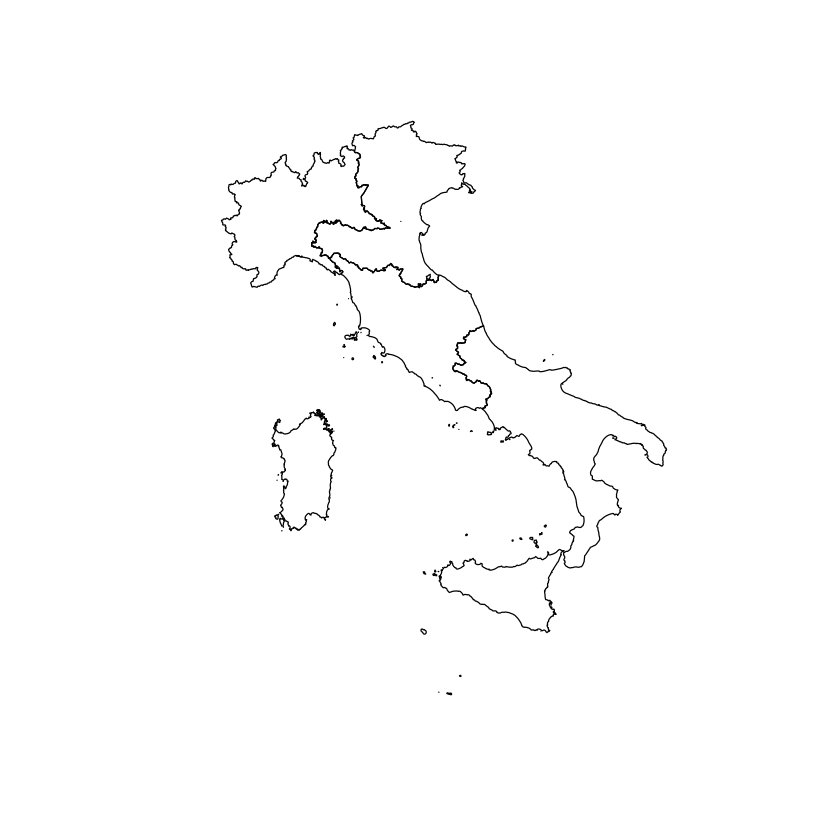

In [5]:
plot(macroregioni$geom)

In [6]:
regioni <- st_read(temp_file, layer = "regions")
provincie = st_read(temp_file, layer = "provinces")
comuni = st_read(temp_file, layer = "municipalities")

Reading layer `regions' from data source `/tmp/RtmpxoRhYA/file68468676b44.gpkg' using driver `GPKG'
Simple feature collection with 20 features and 3 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 313279.3 ymin: 3933826 xmax: 1312016 ymax: 5220292
Projected CRS: WGS 84 / UTM zone 32N
Reading layer `provinces' from data source `/tmp/RtmpxoRhYA/file68468676b44.gpkg' using driver `GPKG'
Simple feature collection with 107 features and 10 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 313279.3 ymin: 3933826 xmax: 1312016 ymax: 5220292
Projected CRS: WGS 84 / UTM zone 32N
Reading layer `municipalities' from data source 
  `/tmp/RtmpxoRhYA/file68468676b44.gpkg' using driver `GPKG'
Simple feature collection with 7899 features and 10 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 313279.3 ymin: 3933826 xmax: 1312016 ymax: 5220292
Projected CRS: WGS 84 / UTM zone 32N


In [7]:
regioni

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



COD_RIP,COD_REG,DEN_REG,geom
<dbl>,<dbl>,<chr>,<MULTIPOLYGON [m]>
1,1,Piemonte,MULTIPOLYGON (((457749.5 51...
1,2,Valle d'Aosta,MULTIPOLYGON (((390652.6 50...
1,3,Lombardia,MULTIPOLYGON (((485536.5 49...
2,4,Trentino-Alto Adige,MULTIPOLYGON (((743273.9 52...
2,5,Veneto,MULTIPOLYGON (((768135.2 51...
2,6,Friuli-Venezia Giulia,MULTIPOLYGON (((871036.7 50...
1,7,Liguria,MULTIPOLYGON (((568227.8 48...
2,8,Emilia-Romagna,MULTIPOLYGON (((618343.9 48...
3,9,Toscana,MULTIPOLYGON (((674479.6 46...


ICCU rilascia l'anagrafe delle biblioteche italiane con un file CSV con licenza CC0.<Br/>La pagina informativa è disponibile a questo indirizzo
[https://anagrafe.iccu.sbn.it/it/open-data/](https://anagrafe.iccu.sbn.it/it/open-data/)

Il download invece qui [https://opendata.anagrafe.iccu.sbn.it/territorio.zip](https://opendata.anagrafe.iccu.sbn.it/territorio.zip)

Si tratta di un file csv compresso

In [35]:
# Definisci l'URL del file ZIP
url <- "https://raw.githubusercontent.com/napo/sna_geospatial_datascience/refs/heads/main/data/territorio.zip"

# Crea un file temporaneo per scaricare lo ZIP
temp_zip <- tempfile(fileext = ".zip")

# Crea una directory temporanea per estrarre i file
temp_dir <- tempdir()

# Scarica il file ZIP dall'URL
download.file(url, temp_zip, mode = "wb")

# Estrai il contenuto dello ZIP nella directory temporanea
unzipped_files <- unzip(temp_zip, exdir = temp_dir)

In [36]:
# Identifica il file CSV all'interno dello ZIP
csv_files <- unzipped_files[grepl("\\.csv$", unzipped_files, ignore.case = TRUE)]

In [37]:
csv_files

[1] "/tmp/RtmpxoRhYA/biblioteche.csv"

In [38]:
# Leggi il file CSV utilizzando 'read_delim' con delimitatore ';'
biblioteche <- read_delim(csv_files[1], delim = ",",show_col_types = FALSE)


In [39]:
head(biblioteche,2)

codice-isil,codice-sbn,denominazione,indirizzo,frazione,cap,comune,codice istat comune,provincia,regione,codice istat provincia,latitudine,longitudine,telefono,fax,email,url
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
IT-AG0001,AGR27,Biblioteca della Soprintendenza per i beni culturali e ambientali Pirro Marconi,Contrada S. Nicola,NA,92100,Agrigento,84001,Agrigento,SICILIA,84,37.33617,13.58807,+39 0922595830,NA,NA,NA
IT-AG0005,NA,Biblioteca dell'Archivio di Stato di Agrigento,via Mazzini 185,NA,92100,Agrigento,84001,Agrigento,SICILIA,84,37.32216,13.58860,+39 0922602494,+39 0922613242,as-ag@cultura.gov.it,http://www.archiviodistatoagrigento.beniculturali.it/index.php?it/1/home


In [40]:
# Specificamente, verifica 'latitudine'
summary(biblioteche$latitudine)
summary(biblioteche$longitudine)


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  35.50   41.11   43.90   43.17   45.41   47.02 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  6.702   9.511  11.834  11.835  13.657  18.494 

In [41]:
# Crea l'oggetto sf
geo_biblioteche <- st_as_sf(
  biblioteche,
  coords = c("longitudine", "latitudine"),
  crs = 4326,  # CRS EPSG:4326 (WGS84)
  remove = FALSE  # Mantiene le colonne originali delle coordinate
)

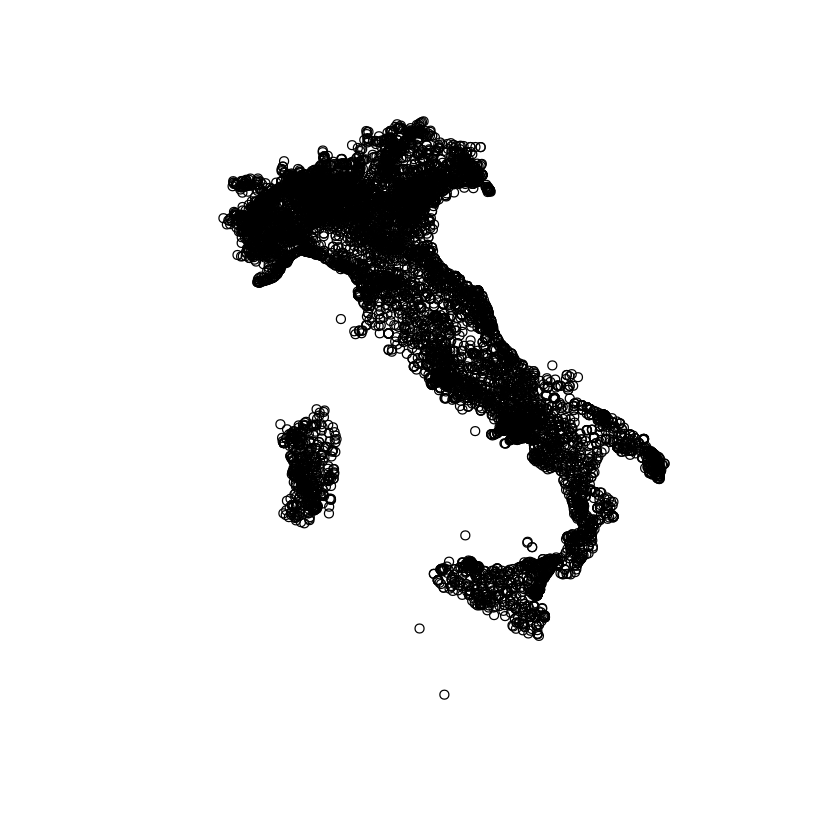

In [42]:
plot(geo_biblioteche$geometry)

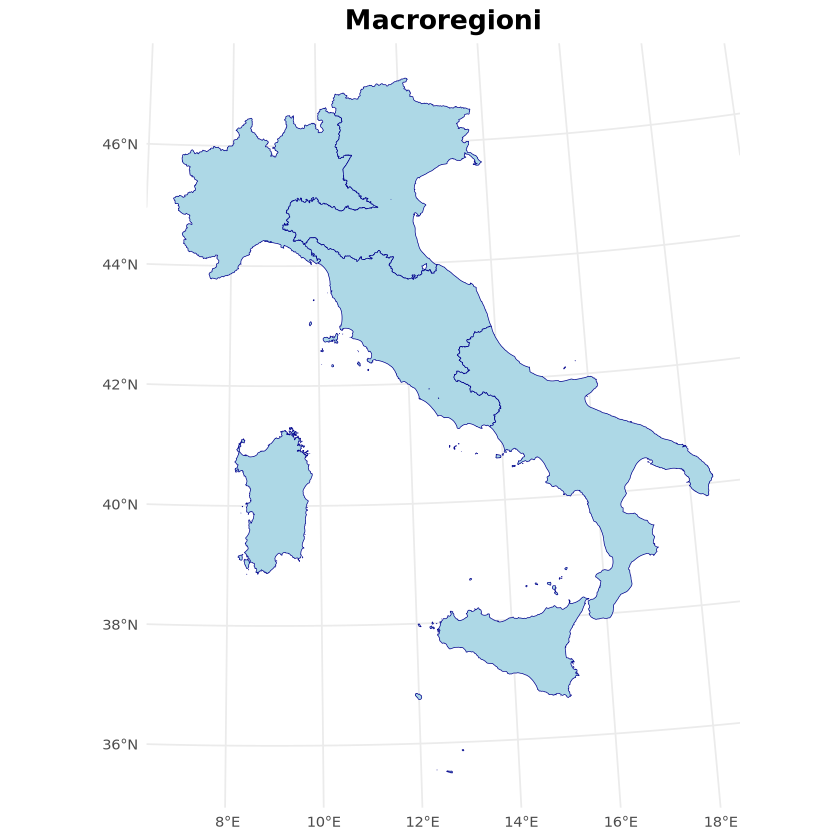

In [43]:
ggplot(data = macroregioni) +
  geom_sf(fill = "lightblue", color = "darkblue") +  
  theme_minimal() +
  ggtitle("Macroregioni") +
  theme(
    plot.title = element_text(hjust = 0.5, size = 16, face = "bold")
  )

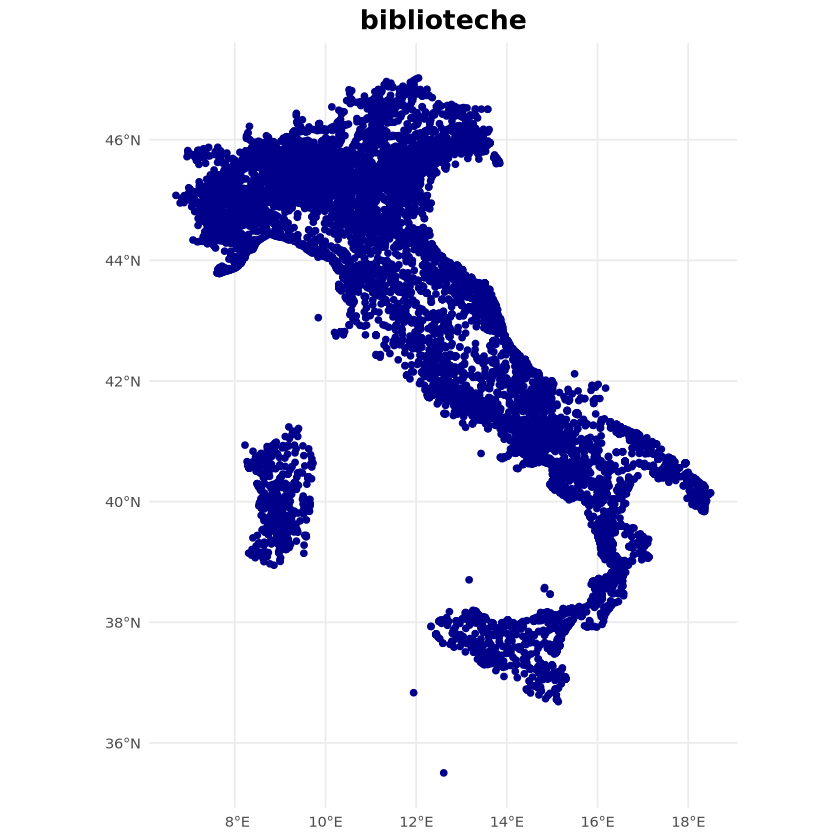

In [44]:
ggplot(data = geo_biblioteche) +
  geom_sf(fill = "lightblue", color = "darkblue") +  
  theme_minimal() +
  ggtitle("biblioteche") +
  theme(
    plot.title = element_text(hjust = 0.5, size = 16, face = "bold")
  )

In [24]:
st_crs(macroregioni)

Coordinate Reference System:
  User input: WGS 84 / UTM zone 32N 
  wkt:
PROJCRS["WGS 84 / UTM zone 32N",
    BASEGEOGCRS["WGS 84",
        ENSEMBLE["World Geodetic System 1984 ensemble",
            MEMBER["World Geodetic System 1984 (Transit)"],
            MEMBER["World Geodetic System 1984 (G730)"],
            MEMBER["World Geodetic System 1984 (G873)"],
            MEMBER["World Geodetic System 1984 (G1150)"],
            MEMBER["World Geodetic System 1984 (G1674)"],
            MEMBER["World Geodetic System 1984 (G1762)"],
            MEMBER["World Geodetic System 1984 (G2139)"],
            MEMBER["World Geodetic System 1984 (G2296)"],
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]],
            ENSEMBLEACCURACY[2.0]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 32N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PA

**ERRORE**!<br/>
Va usata la stessa proiezione<br/>
La proiezione usata da ISTAT è EPSG:32632

sovraponianmo usando la stessa proiezione

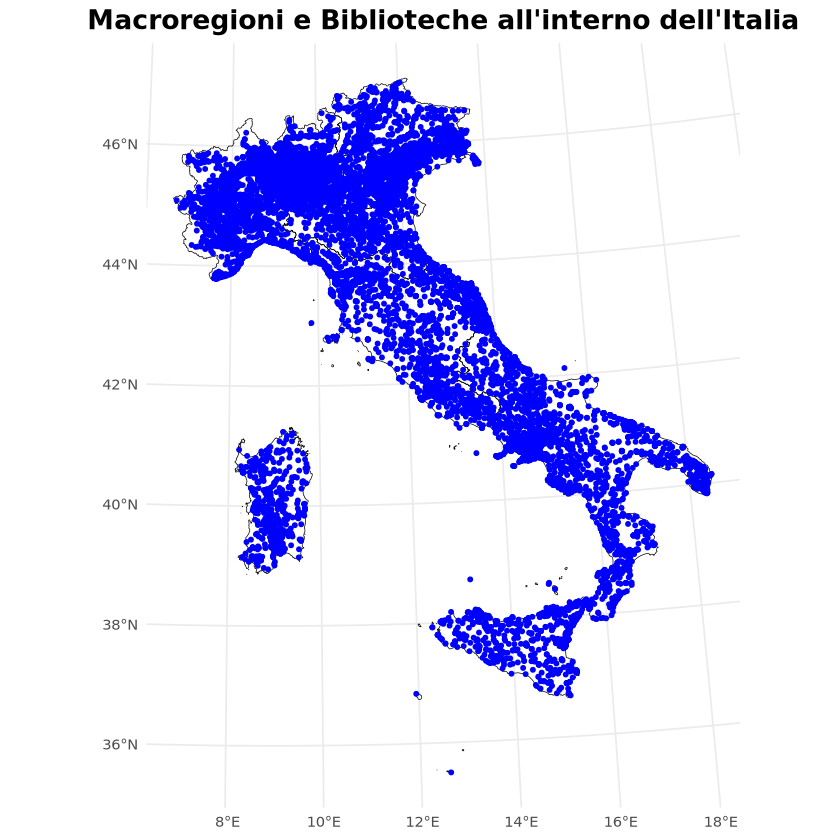

In [45]:

ggplot() +
  geom_sf(data = macroregioni, color = "black", fill = NA) +  # Macroregioni con bordi neri e senza riempimento
  geom_sf(data = geo_biblioteche, color = "blue", size = 1) +  # Biblioteche in blu
  theme_minimal() +
  ggtitle("Macroregioni e Biblioteche all'interno dell'Italia") +
  theme(
    plot.title = element_text(hjust = 0.5, size = 16, face = "bold")
  )

In [26]:
macroregioni_4326 <- st_transform(macroregioni, crs = 4326)

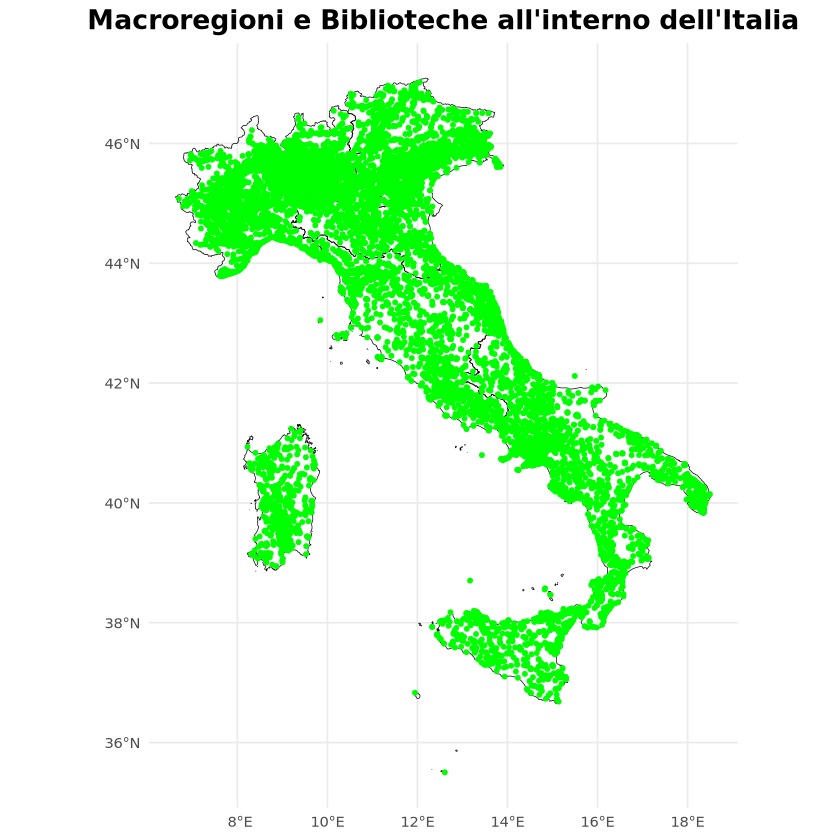

In [48]:
ggplot() +
  geom_sf(data = macroregioni_4326, color = "black", fill = NA) +
  geom_sf(data = geo_biblioteche, color = "green", size = 1) +
  theme_minimal() +
  ggtitle("Macroregioni e Biblioteche all'interno dell'Italia") +
  theme(
    plot.title = element_text(hjust = 0.5, size = 16, face = "bold")
  )

---
# Relazioni spaziali
## come due oggetti spaziali si relazionano fra di loro

![](https://upload.wikimedia.org/wikipedia/commons/5/55/TopologicSpatialRelarions2.png)

from [https://en.wikipedia.org/wiki/Spatial_relation](https://en.wikipedia.org/wiki/Spatial_relation)

## Relazione fra oggetti singoli

Es.<br>
Questa biblioteca si trova nella macroregione italiana a Nord-Est?

estriamo la regione a Nord-Est

In [50]:
macroregioni_4326

,COD_RIP,DEN_RIP,geom
,<dbl>,<chr>,<MULTIPOLYGON [°]>
1,1,Nord-ovest,MULTIPOLYGON (((9.851328 44...
2,2,Nord-est,MULTIPOLYGON (((10.4808 44....
3,3,Centro,MULTIPOLYGON (((13.45607 40...
4,4,Sud,MULTIPOLYGON (((15.80124 39...
5,5,Isole,MULTIPOLYGON (((12.56001 35...


In [54]:
northeast <- macroregioni_4326$geom[2]

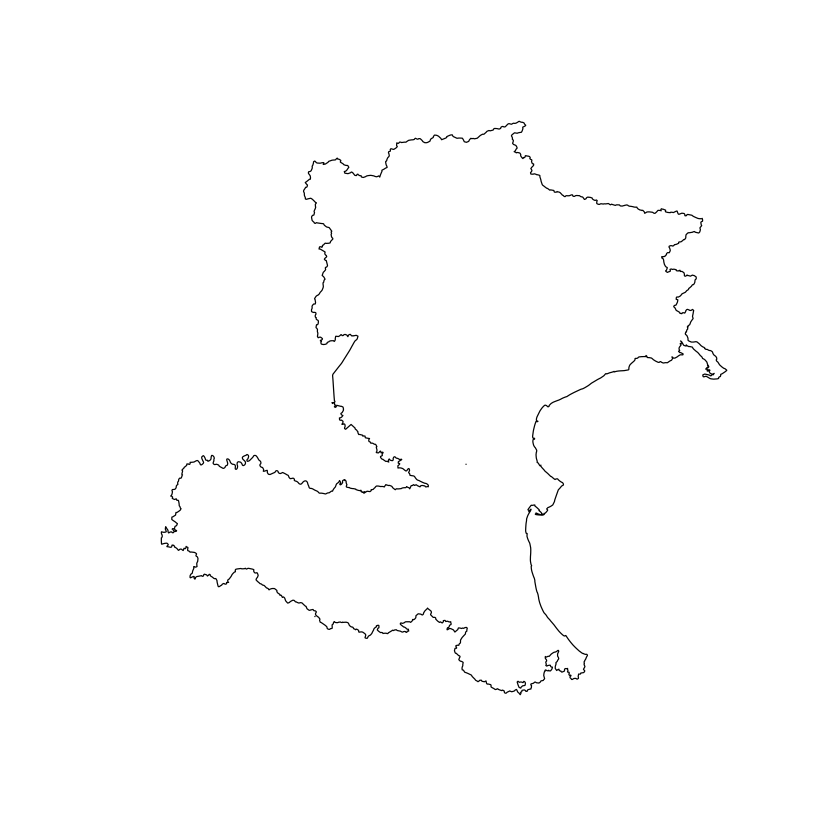

In [56]:
plot(northeast)